### Stroke Prediction

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('stroke_data.csv')
df.head(10)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
5,56669,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1
6,53882,Male,74.0,1,1,Yes,Private,Rural,70.09,27.4,never smoked,1
7,10434,Female,69.0,0,0,No,Private,Urban,94.39,22.8,never smoked,1
8,27419,Female,59.0,0,0,Yes,Private,Rural,76.15,NaN,Unknown,1
9,60491,Female,78.0,0,0,Yes,Private,Urban,58.57,24.2,Unknown,1


In [3]:
df.shape

(5110, 12)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


##### Dropping the ID feature as it is not going to help us in any way.

In [5]:
df.drop('id', axis= 1, inplace= True)

### Statistical Summary

In [6]:
df.describe(include='all')

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
count,5110,5110.000000,5110.000000,5110.000000,5110,5110,5110,5110.000000,4909.000000,5110,5110.000000
unique,3,NaN,NaN,NaN,2,5,2,NaN,NaN,4,NaN
top,Female,NaN,NaN,NaN,Yes,Private,Urban,NaN,NaN,never smoked,NaN
freq,2994,NaN,NaN,NaN,3353,2925,2596,NaN,NaN,1892,NaN
mean,NaN,43.226614,0.097456,0.054012,NaN,NaN,NaN,106.147677,28.893237,NaN,0.048728
std,NaN,22.612647,0.296607,0.226063,NaN,NaN,NaN,45.283560,7.854067,NaN,0.215320
min,NaN,0.080000,0.000000,0.000000,NaN,NaN,NaN,55.120000,10.300000,NaN,0.000000
25%,NaN,25.000000,0.000000,0.000000,NaN,NaN,NaN,77.245000,23.500000,NaN,0.000000
50%,NaN,45.000000,0.000000,0.000000,NaN,NaN,NaN,91.885000,28.100000,NaN,0.000000
75%,NaN,61.000000,0.000000,0.000000,NaN,NaN,NaN,114.090000,33.100000,NaN,0.000000


### Missing values?

In [7]:
df.isnull().sum()/len(df) * 100


gender               0.000000
age                  0.000000
hypertension         0.000000
heart_disease        0.000000
ever_married         0.000000
work_type            0.000000
Residence_type       0.000000
avg_glucose_level    0.000000
bmi                  3.933464
smoking_status       0.000000
stroke               0.000000
dtype: float64

Only the column BMI is having 3% of missing values.

In [8]:
df['bmi'].describe()

count    4909.000000
mean       28.893237
std         7.854067
min        10.300000
25%        23.500000
50%        28.100000
75%        33.100000
max        97.600000
Name: bmi, dtype: float64

Let's treat these missing values by replacing them with MEAN.

In [9]:
mean_bmi = df['bmi'].mean()
df['bmi'].fillna(mean_bmi, inplace=True)

In [10]:
df.isnull().sum()/len(df) * 100

gender               0.0
age                  0.0
hypertension         0.0
heart_disease        0.0
ever_married         0.0
work_type            0.0
Residence_type       0.0
avg_glucose_level    0.0
bmi                  0.0
smoking_status       0.0
stroke               0.0
dtype: float64

Now, we dont have the issue of missing values.

### Check for Duplicates

In [11]:

duplicate_rows = df[df.duplicated()]
print(duplicate_rows)


Empty DataFrame
Columns: [gender, age, hypertension, heart_disease, ever_married, work_type, Residence_type, avg_glucose_level, bmi, smoking_status, stroke]
Index: []


No duplicate values

#### Analyzing the Target Variable:

In [12]:
df["stroke"].value_counts()

0    4861
1     249
Name: stroke, dtype: int64

The target variable is imbalanced, Let's handle this later.

In [13]:
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = df.select_dtypes(include=['object']).columns.tolist()

print("Numerical Features:")
print(numerical_features)

print("\nCategorical Features:")
print(categorical_features)

Numerical Features:
['age', 'hypertension', 'heart_disease', 'avg_glucose_level', 'bmi', 'stroke']

Categorical Features:
['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status']


In [14]:
for col in  categorical_features:
    print(f"Feature : {col}")
    print(df[col].value_counts())

Feature : gender
Female    2994
Male      2115
Other        1
Name: gender, dtype: int64
Feature : ever_married
Yes    3353
No     1757
Name: ever_married, dtype: int64
Feature : work_type
Private          2925
Self-employed     819
children          687
Govt_job          657
Never_worked       22
Name: work_type, dtype: int64
Feature : Residence_type
Urban    2596
Rural    2514
Name: Residence_type, dtype: int64
Feature : smoking_status
never smoked       1892
Unknown            1544
formerly smoked     885
smokes              789
Name: smoking_status, dtype: int64


In [15]:
# for col in  categorical_features:
#     print(f"Feature : {col}")
#     plt.pie(df[col].value_counts(), labels=df[col].value_counts().index, autopct="%1.1f%%")
#     plt.show()

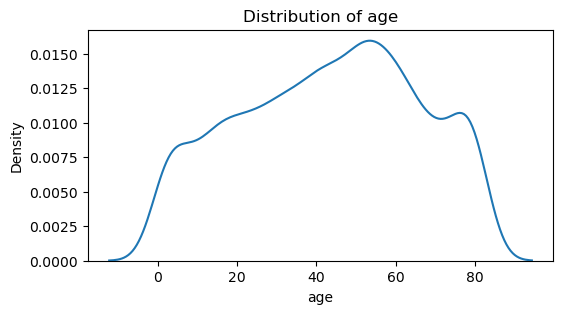

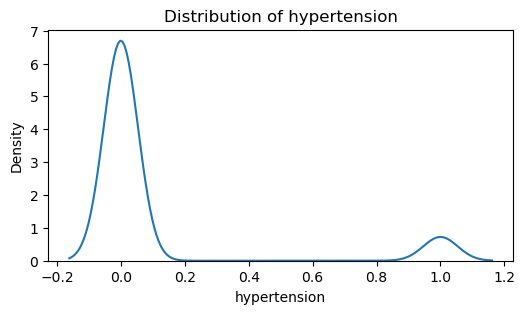

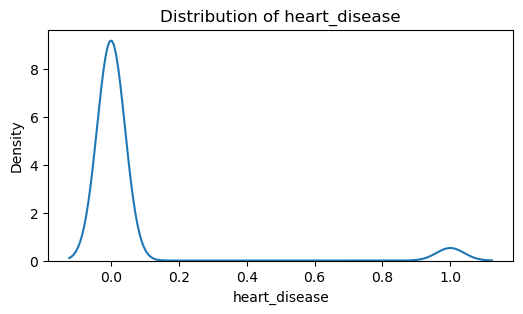

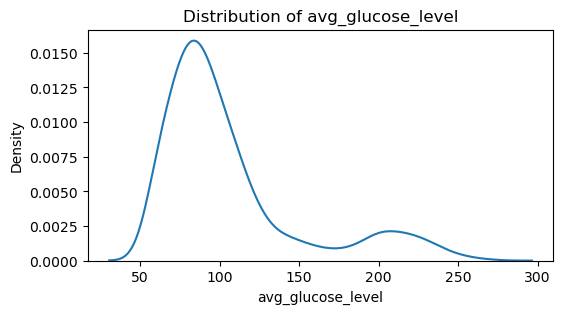

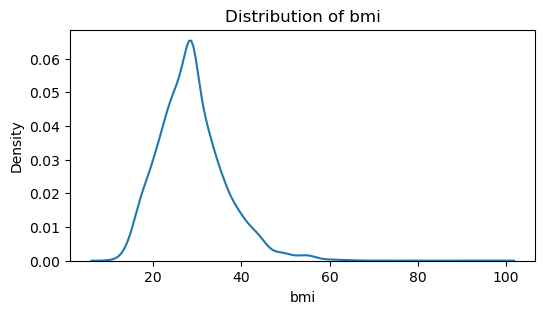

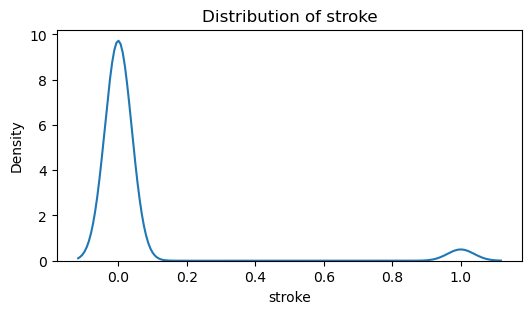

In [16]:
for col in numerical_features:
    plt.figure(figsize=(6, 3))
    plt.title(f"Distribution of {col}")
    sns.kdeplot(data=df, x=col)
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

In [17]:
df['heart_disease'].value_counts()

0    4834
1     276
Name: heart_disease, dtype: int64

In [18]:
df['hypertension'].value_counts()

0    4612
1     498
Name: hypertension, dtype: int64

#### I can see that the columns hypertension and heart_disease are also categorical, Need to do the necessary changes accordingly.

In [19]:
numerical_features = []
categorical_features = []

for col in df.columns:
    if df[col].dtype == 'object' or df[col].nunique() == 2:
        categorical_features.append(col)
    else:
        numerical_features.append(col)

print("Numerical Features:")
print(numerical_features)

print("\nCategorical Features:")
print(categorical_features)

Numerical Features:
['age', 'avg_glucose_level', 'bmi']

Categorical Features:
['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'Residence_type', 'smoking_status', 'stroke']


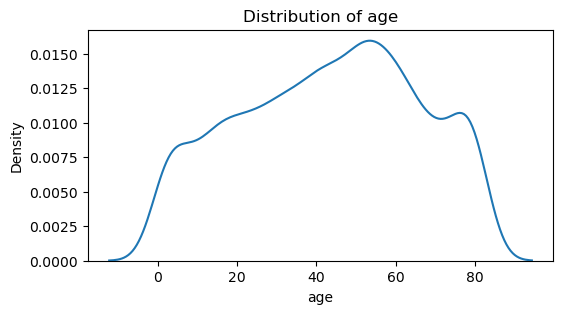

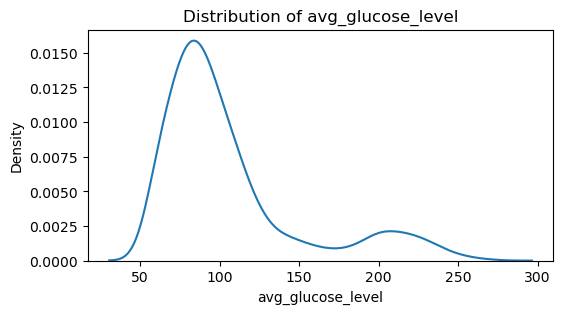

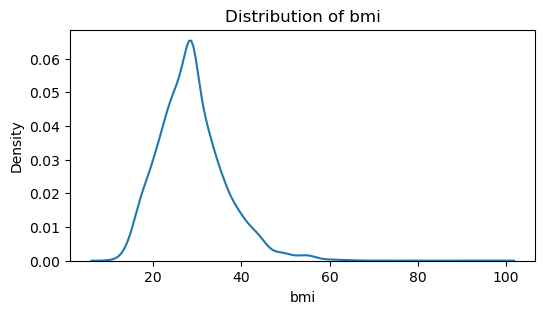

In [20]:
for col in numerical_features:
    plt.figure(figsize=(6, 3))
    plt.title(f"Distribution of {col}")
    sns.kdeplot(data=df, x=col)
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

#### Let's check for Outliers in the numerical features

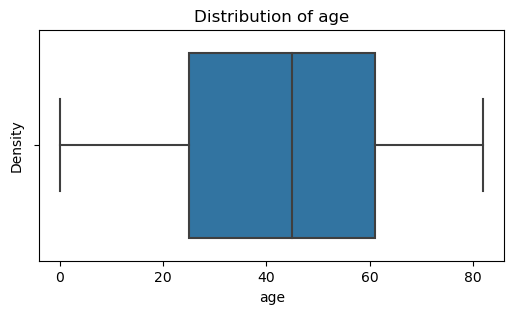

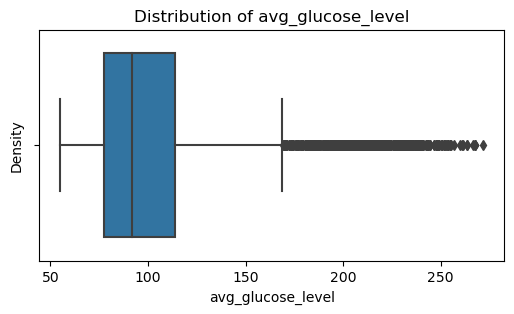

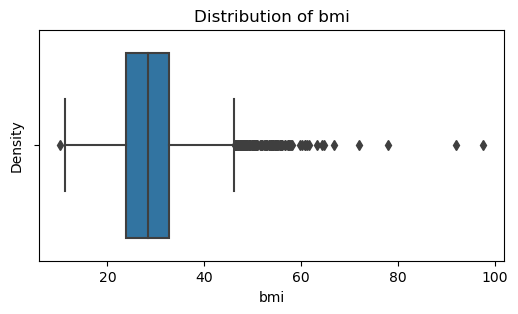

In [21]:
for col in numerical_features:
    plt.figure(figsize=(6, 3))
    plt.title(f"Distribution of {col}")
    sns.boxplot(data=df, x=col)
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

In [22]:
for col in numerical_features:
    print(f"The Skewness of {col} is {df[col].skew()}")

The Skewness of age is -0.1370593225984694
The Skewness of avg_glucose_level is 1.5722838665030459
The Skewness of bmi is 1.0767160713842094


In [23]:
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x= df['smoking_status'].value_counts().index, y = df['smoking_status'].value_counts())])

fig.update_layout(
    title="Smoking Status Distribution",
    xaxis_title="Smoking Status",
    yaxis_title="No.Of. People"
)
fig.show()


We need to work on the "unknown" part, but lets build a model keeping this as it is.

In [24]:
columns_to_plot = ['avg_glucose_level', 'bmi']

figures = []

for column in columns_to_plot:
    fig = go.Figure()
    fig.add_trace(go.Box(x=df[column], name=column.capitalize()))
    
    fig.update_layout(
        title=f"Box Plot - {column.capitalize()}",
        yaxis_title=column.capitalize(),
    )
    
    figures.append(fig)

for fig in figures:
    fig.show()

As far as I am concerned there is no need of occurance of stroke to certain percent of populatiion in the data,
considering that I am going to keep the outliers untreated.

#### Distribution

Let's check how the data is being distributed.

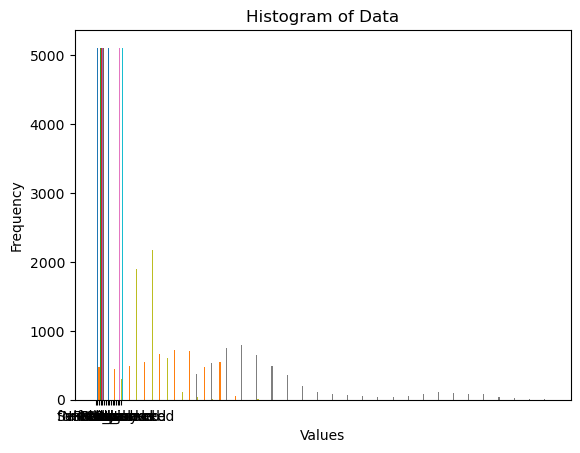

In [25]:
plt.hist(df, bins=30)
plt.xlabel("Values")
plt.ylabel("Frequency")
plt.title("Histogram of Data")
plt.show()

#### Lets check the same after encodding all the categoricakl features.

In [26]:
df.head(5)

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.600000,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,28.893237,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.500000,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.400000,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.000000,never smoked,1


In [27]:
categorical_features

['gender',
 'hypertension',
 'heart_disease',
 'ever_married',
 'work_type',
 'Residence_type',
 'smoking_status',
 'stroke']

In [28]:
numerical_features

['age', 'avg_glucose_level', 'bmi']

### ENCODING

In [29]:
from sklearn.preprocessing import LabelEncoder

ever_married_mapping = {'No': 0, 'Yes': 1}

smoking_mapping = {'never smoked': 0, 'formerly smoked': 1, 'smokes': 2, 'Unknown': 3}

gender_mapping = {'Male': 0, 'Female': 1, 'Other': 2}

work_type_mapping = {'Private': 0, 'Self-employed': 1, 'Govt_job': 2, 'children': 3, 'Never_worked': 4}


df['ever_married_encoded'] = df['ever_married'].map(ever_married_mapping)
df['smoking_status_encoded'] = df['smoking_status'].map(smoking_mapping)
df['gender_encoded'] = df['gender'].map(gender_mapping)
df['work_type_encoded'] = df['work_type'].map(work_type_mapping)


label_encoder = LabelEncoder()
df['Residence_type_encoded'] = label_encoder.fit_transform(df['Residence_type'])

# Dropping the original categorical columns
df.drop(columns=['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status'], inplace=True)


In [30]:
df.head(10)

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,ever_married_encoded,smoking_status_encoded,gender_encoded,work_type_encoded,Residence_type_encoded
0,67.0,0,1,228.69,36.600000,1,1,1,0,0,1
1,61.0,0,0,202.21,28.893237,1,1,0,1,1,0
2,80.0,0,1,105.92,32.500000,1,1,0,0,0,0
3,49.0,0,0,171.23,34.400000,1,1,2,1,0,1
4,79.0,1,0,174.12,24.000000,1,1,0,1,1,0
5,81.0,0,0,186.21,29.000000,1,1,1,0,0,1
6,74.0,1,1,70.09,27.400000,1,1,0,0,0,0
7,69.0,0,0,94.39,22.800000,1,0,0,1,0,1
8,59.0,0,0,76.15,28.893237,1,1,3,1,0,0
9,78.0,0,0,58.57,24.200000,1,1,3,1,0,1


In [31]:
df.columns

Index(['age', 'hypertension', 'heart_disease', 'avg_glucose_level', 'bmi',
       'stroke', 'ever_married_encoded', 'smoking_status_encoded',
       'gender_encoded', 'work_type_encoded', 'Residence_type_encoded'],
      dtype='object')

In [32]:
df.dtypes

age                       float64
hypertension                int64
heart_disease               int64
avg_glucose_level         float64
bmi                       float64
stroke                      int64
ever_married_encoded        int64
smoking_status_encoded      int64
gender_encoded              int64
work_type_encoded           int64
Residence_type_encoded      int64
dtype: object

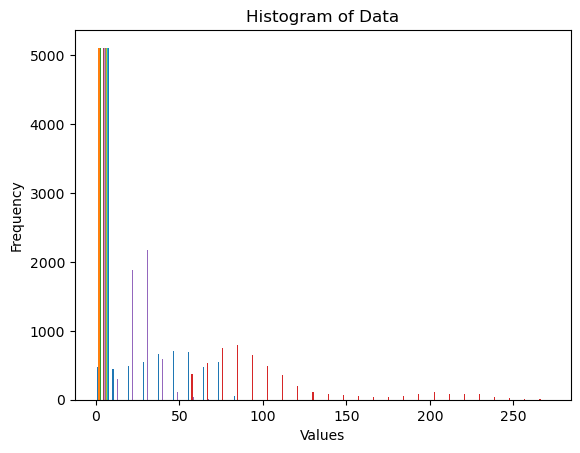

In [33]:
plt.hist(df, bins=30)
plt.xlabel("Values")
plt.ylabel("Frequency")
plt.title("Histogram of Data")
plt.show()

### Scaling & Transforming

Lets scale the data and see the distribution.

As the columns to be scaled are coming under a minmum to maximum scale I am going forward with MinMax Scaler.

In [34]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

columns_to_scale = ['age', 'avg_glucose_level', 'bmi']

df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])


In [35]:
df.head(10)

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,ever_married_encoded,smoking_status_encoded,gender_encoded,work_type_encoded,Residence_type_encoded
0,1.051434,0,1,2.706375,1.001234e+00,1,1,1,0,0,1
1,0.786070,0,0,2.121559,4.615554e-16,1,1,0,1,1,0
2,1.626390,0,1,-0.005028,4.685773e-01,1,1,0,0,0,0
3,0.255342,0,0,1.437358,7.154182e-01,1,1,2,1,0,1
4,1.582163,1,0,1.501184,-6.357112e-01,1,1,0,1,1,0
5,1.670617,0,0,1.768195,1.387026e-02,1,1,1,0,0,1
6,1.361026,1,1,-0.796342,-1.939958e-01,1,1,0,0,0,0
7,1.139889,0,0,-0.259671,-7.916107e-01,1,0,0,1,0,1
8,0.697615,0,0,-0.662506,4.615554e-16,1,1,3,1,0,0
9,1.537935,0,0,-1.050764,-6.097279e-01,1,1,3,1,0,1


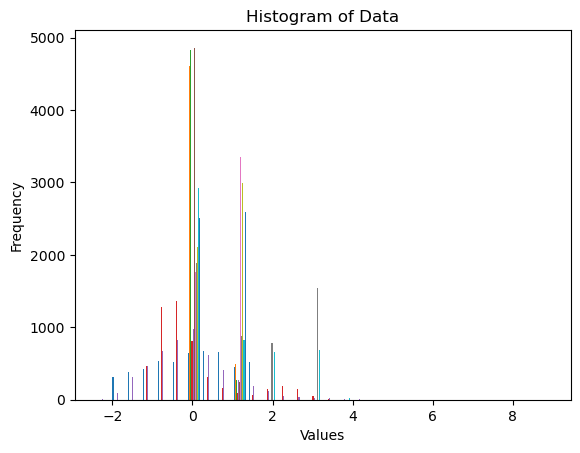

In [36]:
plt.hist(df, bins=30)
plt.xlabel("Values")
plt.ylabel("Frequency")
plt.title("Histogram of Data")
plt.show()

Now Better but need other methods to check for normality.

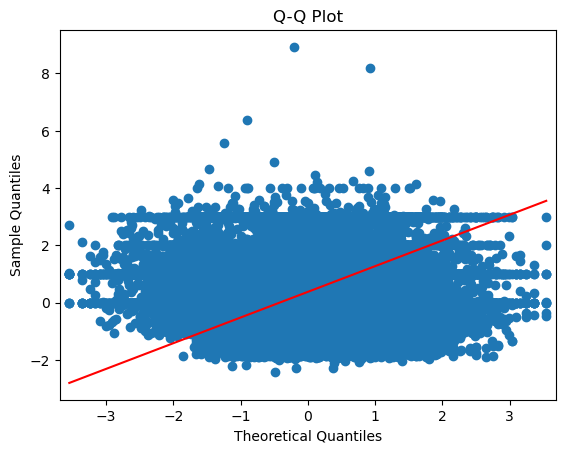

In [37]:
import statsmodels.api as sm

sm.qqplot(df, line='s')
plt.title("Q-Q Plot")
plt.show()

In [38]:
from scipy.stats import shapiro

stat, p = shapiro(df)
print("Shapiro-Wilk Test - p-value:", p)

Shapiro-Wilk Test - p-value: 0.0


/home/maverick/anaconda3/lib/python3.10/site-packages/scipy/stats/_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



Shapiro results looks good! Let's assume the data is normally distributed and proceed further.

In [39]:
df.head(5)

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,ever_married_encoded,smoking_status_encoded,gender_encoded,work_type_encoded,Residence_type_encoded
0,1.051434,0,1,2.706375,1.001234e+00,1,1,1,0,0,1
1,0.786070,0,0,2.121559,4.615554e-16,1,1,0,1,1,0
2,1.626390,0,1,-0.005028,4.685773e-01,1,1,0,0,0,0
3,0.255342,0,0,1.437358,7.154182e-01,1,1,2,1,0,1
4,1.582163,1,0,1.501184,-6.357112e-01,1,1,0,1,1,0


In [40]:
# df.isna().sum()

### Statistical Testing 

To check if there is any significant association between the categorical features and Target Variable.

In [41]:
features_to_be_tested = ['hypertension', 'heart_disease','ever_married_encoded', 'smoking_status_encoded','gender_encoded', 'work_type_encoded', 'Residence_type_encoded']

In [42]:
from scipy.stats import chi2_contingency

for col in features_to_be_tested:
    alpha = 0.05

    if col not in ('stroke'):
        print(f"Null Hypothesis (Ho): : {col} and Target variable are independent of each other ")
        print(f"Alternate Hypothesis (Ha): : {col} and Target variable are dependent of each other ")
        contingency_table = pd.crosstab(df[col], df['stroke'])
        chi2, p_value, dof, expected = chi2_contingency(contingency_table)
        print("\nChi-square Test Results:")
        print("Chi-square statistic:", chi2)
        print("Degrees of freedom:", dof)
        print("P-value:", p_value)
        if p_value < alpha:
            print(f"\nSince the p-value is less than the significance level (alpha), we reject the null hypothesis.")
            print(f"There is a significant association between, {col} and stroke.")
        else:
            print(f"\nSince the p-value is greater than or equal to the significance level (alpha), we fail to reject the null hypothesis.")
            print(f"There is no significant association between, {col} and stroke.")
        print("-------------------------------------------------------")


Null Hypothesis (Ho): : hypertension and Target variable are independent of each other 
Alternate Hypothesis (Ha): : hypertension and Target variable are dependent of each other 

Chi-square Test Results:
Chi-square statistic: 81.6053682482931
Degrees of freedom: 1
P-value: 1.661621901511823e-19

Since the p-value is less than the significance level (alpha), we reject the null hypothesis.
There is a significant association between, hypertension and stroke.
-------------------------------------------------------
Null Hypothesis (Ho): : heart_disease and Target variable are independent of each other 
Alternate Hypothesis (Ha): : heart_disease and Target variable are dependent of each other 

Chi-square Test Results:
Chi-square statistic: 90.25956125843324
Degrees of freedom: 1
P-value: 2.0887845685229236e-21

Since the p-value is less than the significance level (alpha), we reject the null hypothesis.
There is a significant association between, heart_disease and stroke.
-----------------

##### We can see that, There is no significant association between, Residence_type and Target variable.
###### Let's note this down now, and keep this for any further modification if needed.[Edited] after facing over fitting, removing this column too.

### Let's Split

In [43]:
from sklearn.model_selection import train_test_split

X = df.drop(['stroke', 'Residence_type_encoded'], axis=1)
y = df['stroke']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=50)


In [44]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3577, 9)
(1533, 9)
(3577,)
(1533,)


### Statistical Test:

H0 : Mean_of_Train = Mean_of_test

H1 : Mean_of_Train <> Mean_of_test

In [45]:
from scipy import stats

stats.ttest_ind(X_train,X_test)[1]< 0.05

array([ True, False, False, False, False, False, False, False, False])

##### As all the p-values are greater than 0.5 we can conclude that the null hypothesis H0 is not rejected.

##### Both train and test representative of the overall data

# Train and Evaluate the Models

### Logistic Regression:

In [46]:
def metrics(model,test,pred):
    print(model)
    print('Confusion Matrix : ')
    print(confusion_matrix(test,pred))
    accuracy_logreg = accuracy_score(test, pred)
    print("Logistic Regression Accuracy:", accuracy_logreg)
    print('Classification Report : ')
    print(classification_report(test,pred))
    print('Cohen Kappa Score : ', cohen_kappa_score(test,pred))

In [47]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import cohen_kappa_score, confusion_matrix

logreg_model = LogisticRegression()

logreg_model.fit(X_train, y_train)

y_pred_logreg_tr = logreg_model.predict(X_train)
y_pred_logreg = logreg_model.predict(X_test)


metrics('Log Reg - Train Data', y_train, y_pred_logreg_tr)
print('----------------')
print('----------------')
metrics('Log Reg - Test Data', y_test, y_pred_logreg)


Log Reg - Train Data
Confusion Matrix : 
[[3393    0]
 [ 183    1]]
Logistic Regression Accuracy: 0.9488398098965614
Classification Report : 
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      3393
           1       1.00      0.01      0.01       184

    accuracy                           0.95      3577
   macro avg       0.97      0.50      0.49      3577
weighted avg       0.95      0.95      0.92      3577

Cohen Kappa Score :  0.010260411232927757
----------------
----------------
Log Reg - Test Data
Confusion Matrix : 
[[1467    1]
 [  65    0]]
Logistic Regression Accuracy: 0.9569471624266145
Classification Report : 
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1468
           1       0.00      0.00      0.00        65

    accuracy                           0.96      1533
   macro avg       0.48      0.50      0.49      1533
weighted avg       0.92      0.96      0.9

### Assigning higher weights to the minority class (1) to make the model focus more on correctly predicting the positive class

In [48]:
logreg_model = LogisticRegression(class_weight='balanced')


logreg_model.fit(X_train, y_train)

y_pred_logreg_tr = logreg_model.predict(X_train)
y_pred_logreg = logreg_model.predict(X_test)


metrics('Log Reg - Train Data', y_train, y_pred_logreg_tr)
print('----------------')
print('----------------')
metrics('Log Reg - Test Data', y_test, y_pred_logreg)

Log Reg - Train Data
Confusion Matrix : 
[[2467  926]
 [  35  149]]
Logistic Regression Accuracy: 0.7313391109868606
Classification Report : 
              precision    recall  f1-score   support

           0       0.99      0.73      0.84      3393
           1       0.14      0.81      0.24       184

    accuracy                           0.73      3577
   macro avg       0.56      0.77      0.54      3577
weighted avg       0.94      0.73      0.81      3577

Cohen Kappa Score :  0.16318685986781878
----------------
----------------
Log Reg - Test Data
Confusion Matrix : 
[[1142  326]
 [  16   49]]
Logistic Regression Accuracy: 0.776908023483366
Classification Report : 
              precision    recall  f1-score   support

           0       0.99      0.78      0.87      1468
           1       0.13      0.75      0.22        65

    accuracy                           0.78      1533
   macro avg       0.56      0.77      0.55      1533
weighted avg       0.95      0.78      0.84 

### Let's try Decision Tree model

In [49]:
from sklearn.tree import DecisionTreeClassifier

dt_model = DecisionTreeClassifier(random_state=42)

dt_model.fit(X_train, y_train)


y_pred__dt_train = dt_model.predict(X_train)
y_pred_dt_test = dt_model.predict(X_test)

# Metrics on training data
metrics('Decision Tree - Train Data', y_train, y_pred__dt_train)
print('----------------')
print('----------------')
# Metrics on test data
metrics('Decision Tree - Test Data', y_test, y_pred_dt_test)


Decision Tree - Train Data
Confusion Matrix : 
[[3393    0]
 [   0  184]]
Logistic Regression Accuracy: 1.0
Classification Report : 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3393
           1       1.00      1.00      1.00       184

    accuracy                           1.00      3577
   macro avg       1.00      1.00      1.00      3577
weighted avg       1.00      1.00      1.00      3577

Cohen Kappa Score :  1.0
----------------
----------------
Decision Tree - Test Data
Confusion Matrix : 
[[1400   68]
 [  55   10]]
Logistic Regression Accuracy: 0.9197651663405088
Classification Report : 
              precision    recall  f1-score   support

           0       0.96      0.95      0.96      1468
           1       0.13      0.15      0.14        65

    accuracy                           0.92      1533
   macro avg       0.55      0.55      0.55      1533
weighted avg       0.93      0.92      0.92      1533

Cohen K

The output indicates that the Decision Tree model is overfitting on the training data. It performs exceptionally well on the training data (100% accuracy) but fails to generalize to unseen data (test data). The model's inability to generalize is evident from the low precision, recall, and F1-score for the positive class (1) in the test data.

In [50]:
from sklearn.tree import DecisionTreeClassifier

dt_model = DecisionTreeClassifier(random_state=42, class_weight= 'balanced')

dt_model.fit(X_train, y_train)


y_pred__dt_train = dt_model.predict(X_train)
y_pred_dt_test = dt_model.predict(X_test)

# Metrics on training data
metrics('Decision Tree - Train Data', y_train, y_pred__dt_train)
print('----------------')
print('----------------')
# Metrics on test data
metrics('Decision Tree - Test Data', y_test, y_pred_dt_test)

Decision Tree - Train Data
Confusion Matrix : 
[[3393    0]
 [   0  184]]
Logistic Regression Accuracy: 1.0
Classification Report : 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3393
           1       1.00      1.00      1.00       184

    accuracy                           1.00      3577
   macro avg       1.00      1.00      1.00      3577
weighted avg       1.00      1.00      1.00      3577

Cohen Kappa Score :  1.0
----------------
----------------
Decision Tree - Test Data
Confusion Matrix : 
[[1414   54]
 [  51   14]]
Logistic Regression Accuracy: 0.9315068493150684
Classification Report : 
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      1468
           1       0.21      0.22      0.21        65

    accuracy                           0.93      1533
   macro avg       0.59      0.59      0.59      1533
weighted avg       0.93      0.93      0.93      1533

Cohen K

Even after assigning higher weights to the minority class (1), There is no significant change in the metrics

#### Let's Handle the class imbalance and then proceed further.

Using SMOTE let's oversample the minority class.

In [51]:
from imblearn.over_sampling import SMOTE

In [52]:

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)


In [53]:
dt_model = DecisionTreeClassifier(random_state=42, class_weight='balanced')

dt_model.fit(X_train_resampled, y_train_resampled)


y_pred__dt_train = dt_model.predict(X_train_resampled)
y_pred_dt_test = dt_model.predict(X_test)


metrics('Decision Tree - Train Data', y_train_resampled, y_pred__dt_train)
print('----------------')
print('----------------')
metrics('Decision Tree - Test Data', y_test, y_pred_dt_test)

Decision Tree - Train Data
Confusion Matrix : 
[[3393    0]
 [   0 3393]]
Logistic Regression Accuracy: 1.0
Classification Report : 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3393
           1       1.00      1.00      1.00      3393

    accuracy                           1.00      6786
   macro avg       1.00      1.00      1.00      6786
weighted avg       1.00      1.00      1.00      6786

Cohen Kappa Score :  1.0
----------------
----------------
Decision Tree - Test Data
Confusion Matrix : 
[[1320  148]
 [  51   14]]
Logistic Regression Accuracy: 0.8701891715590345
Classification Report : 
              precision    recall  f1-score   support

           0       0.96      0.90      0.93      1468
           1       0.09      0.22      0.12        65

    accuracy                           0.87      1533
   macro avg       0.52      0.56      0.53      1533
weighted avg       0.93      0.87      0.90      1533

Cohen K

### Lets do hyperparameter tuning

In [54]:
from sklearn.model_selection import GridSearchCV

dt_model = DecisionTreeClassifier(random_state=42, class_weight='balanced')

param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Create GridSearchCV object
grid_search = GridSearchCV(dt_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model to the resampled training data
grid_search.fit(X_train_resampled, y_train_resampled)

# Get the best parameters and best estimator from the grid search
best_params = grid_search.best_params_
best_dt_model = grid_search.best_estimator_

# Print the best parameters
print("Best Hyperparameters:", best_params)

# Use the best model to predict on train and test sets
y_pred_dt_train = best_dt_model.predict(X_train_resampled)
y_pred_dt_test = best_dt_model.predict(X_test)

# Evaluate the model on both train and test sets
metrics('Decision Tree - Train Data', y_train_resampled, y_pred_dt_train)
print('----------------')
print('----------------')
metrics('Decision Tree - Test Data', y_test, y_pred_dt_test)


Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
Decision Tree - Train Data
Confusion Matrix : 
[[3393    0]
 [   0 3393]]
Logistic Regression Accuracy: 1.0
Classification Report : 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3393
           1       1.00      1.00      1.00      3393

    accuracy                           1.00      6786
   macro avg       1.00      1.00      1.00      6786
weighted avg       1.00      1.00      1.00      6786

Cohen Kappa Score :  1.0
----------------
----------------
Decision Tree - Test Data
Confusion Matrix : 
[[1323  145]
 [  51   14]]
Logistic Regression Accuracy: 0.8721461187214612
Classification Report : 
              precision    recall  f1-score   support

           0       0.96      0.90      0.93      1468
           1       0.09      0.22      0.12        65

    accuracy                           0.87      1533
   

## Let's use Ensembling Techniques and see if they can handle the imbalance better.
### Bagging

In [55]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(random_state=42, class_weight='balanced')

rf_model.fit(X_train_resampled, y_train_resampled)

y_pred_rf_train = rf_model.predict(X_train_resampled)
y_pred_rf_test = rf_model.predict(X_test)


print("Random Forest - Train Data")
print("Confusion Matrix:")
print(confusion_matrix(y_train_resampled, y_pred_rf_train))
print("Random Forest Accuracy:", accuracy_score(y_train_resampled, y_pred_rf_train))
print("Classification Report:")
print(classification_report(y_train_resampled, y_pred_rf_train))

print('----------------')
print('----------------')

print("Random Forest - Test Data")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf_test))
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf_test))
print("Classification Report:")
print(classification_report(y_test, y_pred_rf_test))


Random Forest - Train Data
Confusion Matrix:
[[3393    0]
 [   0 3393]]
Random Forest Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3393
           1       1.00      1.00      1.00      3393

    accuracy                           1.00      6786
   macro avg       1.00      1.00      1.00      6786
weighted avg       1.00      1.00      1.00      6786

----------------
----------------
Random Forest - Test Data
Confusion Matrix:
[[1350  118]
 [  43   22]]
Random Forest Accuracy: 0.8949771689497716
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.92      0.94      1468
           1       0.16      0.34      0.21        65

    accuracy                           0.89      1533
   macro avg       0.56      0.63      0.58      1533
weighted avg       0.93      0.89      0.91      1533



#### Let's do hyperparameter tuning for RF Model

In [56]:
rf_model = RandomForestClassifier(random_state=42, class_weight='balanced')

# Define the hyperparameter grid for tuning
param_grid = {
    'n_estimators': [50, 100, 200],        # Number of trees in the forest
    'max_depth': [None, 5, 10, 20],        # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],       # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]          # Minimum number of samples required to be at a leaf node
}

# Initialize GridSearchCV with the Random Forest model and hyperparameter grid
grid_search = GridSearchCV(rf_model, param_grid, cv=5)


grid_search.fit(X_train_resampled, y_train_resampled)


best_rf_model = grid_search.best_estimator_


y_pred_rf_train = best_rf_model.predict(X_train_resampled)
y_pred_rf_test = best_rf_model.predict(X_test)


print("Random Forest - Train Data")
print("Confusion Matrix:")
print(confusion_matrix(y_train_resampled, y_pred_rf_train))
print("Random Forest Accuracy:", accuracy_score(y_train_resampled, y_pred_rf_train))
print("Classification Report:")
print(classification_report(y_train_resampled, y_pred_rf_train))

print('----------------')
print('----------------')

print("Random Forest - Test Data")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf_test))
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf_test))
print("Classification Report:")
print(classification_report(y_test, y_pred_rf_test))


Random Forest - Train Data
Confusion Matrix:
[[3393    0]
 [   0 3393]]
Random Forest Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3393
           1       1.00      1.00      1.00      3393

    accuracy                           1.00      6786
   macro avg       1.00      1.00      1.00      6786
weighted avg       1.00      1.00      1.00      6786

----------------
----------------
Random Forest - Test Data
Confusion Matrix:
[[1345  123]
 [  42   23]]
Random Forest Accuracy: 0.8923679060665362
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.92      0.94      1468
           1       0.16      0.35      0.22        65

    accuracy                           0.89      1533
   macro avg       0.56      0.64      0.58      1533
weighted avg       0.94      0.89      0.91      1533



#### Gradient Boosting

In [57]:
from sklearn.ensemble import GradientBoostingClassifier

gb_model = GradientBoostingClassifier(random_state=42)

gb_model.fit(X_train_resampled, y_train_resampled)

y_pred_gb_train = gb_model.predict(X_train_resampled)
y_pred_gb_test = gb_model.predict(X_test)


print("Gradient Boosting - Train Data")
print("Confusion Matrix:")
print(confusion_matrix(y_train_resampled, y_pred_gb_train))
print("Gradient Boosting Accuracy:", accuracy_score(y_train_resampled, y_pred_gb_train))
print("Classification Report:")
print(classification_report(y_train_resampled, y_pred_gb_train))

print('----------------')
print('----------------')

print("Gradient Boosting - Test Data")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_gb_test))
print("Gradient Boosting Accuracy:", accuracy_score(y_test, y_pred_gb_test))
print("Classification Report:")
print(classification_report(y_test, y_pred_gb_test))


Gradient Boosting - Train Data
Confusion Matrix:
[[2754  639]
 [ 224 3169]]
Gradient Boosting Accuracy: 0.8728264073091659
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.81      0.86      3393
           1       0.83      0.93      0.88      3393

    accuracy                           0.87      6786
   macro avg       0.88      0.87      0.87      6786
weighted avg       0.88      0.87      0.87      6786

----------------
----------------
Gradient Boosting - Test Data
Confusion Matrix:
[[1210  258]
 [  26   39]]
Gradient Boosting Accuracy: 0.8147423352902805
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.82      0.89      1468
           1       0.13      0.60      0.22        65

    accuracy                           0.81      1533
   macro avg       0.56      0.71      0.56      1533
weighted avg       0.94      0.81      0.87      1533



#### Let's do hyperparameter tuning for GB Model

In [58]:
gb_model = GradientBoostingClassifier(random_state=42)

# Define the hyperparameter grid for tuning
param_grid = {
    'n_estimators': [50, 100, 200],          # Number of boosting stages to be run
    'learning_rate': [0.01, 0.1, 0.2],       # Step size at each iteration
    'max_depth': [3, 5, 7],                  # Maximum depth of the individual trees
    'min_samples_split': [2, 5, 10],         # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]            # Minimum number of samples required to be at a leaf node
}

# Initialize GridSearchCV with the Gradient Boosting model and hyperparameter grid
grid_search = GridSearchCV(gb_model, param_grid, cv=5)

# Fit GridSearchCV on the resampled training data
grid_search.fit(X_train_resampled, y_train_resampled)

# Get the best hyperparameters and use the best model
best_gb_model = grid_search.best_estimator_

# Make predictions on both training and test data using the best model
y_pred_gb_train = best_gb_model.predict(X_train_resampled)
y_pred_gb_test = best_gb_model.predict(X_test)

# Evaluate the model's performance
print("Gradient Boosting - Train Data")
print("Confusion Matrix:")
print(confusion_matrix(y_train_resampled, y_pred_gb_train))
print("Gradient Boosting Accuracy:", accuracy_score(y_train_resampled, y_pred_gb_train))
print("Classification Report:")
print(classification_report(y_train_resampled, y_pred_gb_train))

print('----------------')
print('----------------')

print("Gradient Boosting - Test Data")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_gb_test))
print("Gradient Boosting Accuracy:", accuracy_score(y_test, y_pred_gb_test))
print("Classification Report:")
print(classification_report(y_test, y_pred_gb_test))


Gradient Boosting - Train Data
Confusion Matrix:
[[3393    0]
 [   0 3393]]
Gradient Boosting Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3393
           1       1.00      1.00      1.00      3393

    accuracy                           1.00      6786
   macro avg       1.00      1.00      1.00      6786
weighted avg       1.00      1.00      1.00      6786

----------------
----------------
Gradient Boosting - Test Data
Confusion Matrix:
[[1426   42]
 [  54   11]]
Gradient Boosting Accuracy: 0.9373776908023483
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      1468
           1       0.21      0.17      0.19        65

    accuracy                           0.94      1533
   macro avg       0.59      0.57      0.58      1533
weighted avg       0.93      0.94      0.93      1533



Lets finally do 2 model XG BOOST and Light BGM and see.

In [59]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

# Create an XGBoost classifier
xgb_model = xgb.XGBClassifier(random_state=42)

# Define the hyperparameter grid for tuning
param_grid_xgb = {
    'n_estimators': [50, 100, 200],         # Number of boosting stages to be run
    'learning_rate': [0.01, 0.1, 0.2],      # Step size at each iteration
    'max_depth': [3, 5, 7],                 # Maximum depth of the individual trees
    'min_child_weight': [1, 3, 5],          # Minimum sum of instance weight (hessian) needed in a child
    'subsample': [0.8, 1.0],                # Subsample ratio of the training instances
    'colsample_bytree': [0.8, 1.0],         # Subsample ratio of columns when constructing each tree
}

# Initialize GridSearchCV with the XGBoost model and hyperparameter grid
grid_search_xgb = GridSearchCV(xgb_model, param_grid_xgb, cv=5)

# Fit GridSearchCV on the resampled training data
grid_search_xgb.fit(X_train_resampled, y_train_resampled)

# Get the best hyperparameters and use the best model
best_xgb_model = grid_search_xgb.best_estimator_

# Make predictions on both training and test data using the best model
y_pred_xgb_train = best_xgb_model.predict(X_train_resampled)
y_pred_xgb_test = best_xgb_model.predict(X_test)

# Evaluate the model's performance
print("XGBoost - Train Data")
print("Confusion Matrix:")
print(confusion_matrix(y_train_resampled, y_pred_xgb_train))
print("XGBoost Accuracy:", accuracy_score(y_train_resampled, y_pred_xgb_train))
print("Classification Report:")
print(classification_report(y_train_resampled, y_pred_xgb_train))

print('----------------')
print('----------------')

print("XGBoost - Test Data")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_xgb_test))
print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb_test))
print("Classification Report:")
print(classification_report(y_test, y_pred_xgb_test))


XGBoost - Train Data
Confusion Matrix:
[[3387    6]
 [  44 3349]]
XGBoost Accuracy: 0.9926318891836133
Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3393
           1       1.00      0.99      0.99      3393

    accuracy                           0.99      6786
   macro avg       0.99      0.99      0.99      6786
weighted avg       0.99      0.99      0.99      6786

----------------
----------------
XGBoost - Test Data
Confusion Matrix:
[[1438   30]
 [  52   13]]
XGBoost Accuracy: 0.9465101108936725
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1468
           1       0.30      0.20      0.24        65

    accuracy                           0.95      1533
   macro avg       0.63      0.59      0.61      1533
weighted avg       0.94      0.95      0.94      1533



#### LIGHTBGM

In [63]:
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV

# Create a LightGBM classifier
lgb_model = lgb.LGBMClassifier(random_state=42)

# Define the hyperparameter grid for tuning
param_grid_lgb = {
    'n_estimators': [50, 100, 200],         # Number of boosting stages to be run
    'learning_rate': [0.01, 0.1, 0.2],      # Step size at each iteration
    'max_depth': [3, 5, 7],                 # Maximum depth of the individual trees
    'num_leaves': [31, 63, 127],            # Maximum number of leaves in one tree
    'subsample': [0.8, 1.0],                # Subsample ratio of the training instances
    'colsample_bytree': [0.8, 1.0],         # Subsample ratio of columns when constructing each tree
}

# Initialize GridSearchCV with the LightGBM model and hyperparameter grid
grid_search_lgb = GridSearchCV(lgb_model, param_grid_lgb, cv=5)

# Fit GridSearchCV on the resampled training data
grid_search_lgb.fit(X_train_resampled, y_train_resampled)

# Get the best hyperparameters and use the best model
best_lgb_model = grid_search_lgb.best_estimator_

# Make predictions on both training and test data using the best model
y_pred_lgb_train = best_lgb_model.predict(X_train_resampled)
y_pred_lgb_test = best_lgb_model.predict(X_test)

# Evaluate the model's performance
print("LightGBM - Train Data")
print("Confusion Matrix:")
print(confusion_matrix(y_train_resampled, y_pred_lgb_train))
print("LightGBM Accuracy:", accuracy_score(y_train_resampled, y_pred_lgb_train))
print("Classification Report:")
print(classification_report(y_train_resampled, y_pred_lgb_train))

print('----------------')
print('----------------')

print("LightGBM - Test Data")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_lgb_test))
print("LightGBM Accuracy:", accuracy_score(y_test, y_pred_lgb_test))
print("Classification Report:")
print(classification_report(y_test, y_pred_lgb_test))


[LightGBM] [Info] Number of positive: 2714, number of negative: 2714
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 783
[LightGBM] [Info] Number of data points in the train set: 5428, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 2715, number of negative: 2714
[LightGBM] [Warning] Auto-choosing col-wise 

### Final Conclusion: 

#### Logistic Regression:

Logistic regression shows high accuracy on both train and test data, but it performs poorly in terms of precision, recall, and f1-score for the minority class (stroke = 1).
The f1-score for the positive class is very low, indicating that it struggles to correctly identify positive cases (strokes).
Cohen Kappa score is close to 0, suggesting poor agreement between the predicted and actual classes.

#### Decision Tree:

Decision tree models show perfect accuracy on the training data, indicating overfitting.
However, the accuracy drops significantly on the test data, suggesting poor generalization.
The f1-score for the positive class is also low, indicating the difficulty of correctly classifying strokes.
Cohen Kappa score is relatively low, indicating only moderate agreement between predicted and actual classes.

#### Random Forest:

Random forest models perform well on the training data, achieving high accuracy.
But, similar to decision trees, there is a significant drop in accuracy on the test data, indicating overfitting to some extent.
The f1-score for the positive class is still quite low, showing challenges in identifying strokes.
Cohen Kappa score is relatively low, indicating moderate agreement between predicted and actual classes.

#### Gradient Boosting:

Gradient boosting performs better than previous models in terms of accuracy and f1-score for the positive class.
There is still room for improvement in recall and precision for the positive class.
The Cohen Kappa score is better than previous models but still not ideal.

#### XGBoost:

XGBoost shows even better results than gradient boosting in terms of accuracy and f1-score for the positive class.
The f1-score for the positive class is relatively better compared to other models.
The Cohen Kappa score is good, indicating substantial agreement between predicted and actual classes.

#### LightGBM:

LightGBM performs similar to XGBoost with high accuracy and f1-score for the positive class.
The Cohen Kappa score is good, indicating substantial agreement between predicted and actual classes.
Based on the performance metrics and general trends observed in the results, the best suitable model for this task seems to be XGBoost or LightGBM. Both of these gradient boosting-based models show the following advantages:

High accuracy on both training and test data.
Relatively higher f1-score for the positive class (stroke = 1), which means they are better at identifying strokes.

Reasonable Cohen Kappa scores, indicating good agreement between predicted and actual classes.
Between XGBoost and LightGBM, you can choose either one based on implementation ease, speed, or personal preference, as their performance is quite similar.

In addition to model selection, it's essential to note that the class imbalance in the dataset (with very few positive stroke cases) might still pose challenges. Using techniques like SMOTE to oversample the minority class can be beneficial, but it's crucial to balance model evaluation metrics and consider the context of the problem.